In [175]:
from seaborn import load_dataset
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import math
import numpy as np
ds = load_dataset('penguins')
ds

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


In [176]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   species            344 non-null    object 
 1   island             344 non-null    object 
 2   bill_length_mm     342 non-null    float64
 3   bill_depth_mm      342 non-null    float64
 4   flipper_length_mm  342 non-null    float64
 5   body_mass_g        342 non-null    float64
 6   sex                333 non-null    object 
dtypes: float64(4), object(3)
memory usage: 18.9+ KB


In [177]:
ds.describe()

,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g
count,342.000000,342.000000,342.000000,342.000000
mean,43.921930,17.151170,200.915205,4201.754386
std,5.459584,1.974793,14.061714,801.954536
min,32.100000,13.100000,172.000000,2700.000000
25%,39.225000,15.600000,190.000000,3550.000000
50%,44.450000,17.300000,197.000000,4050.000000
75%,48.500000,18.700000,213.000000,4750.000000
max,59.600000,21.500000,231.000000,6300.000000


In [178]:
ds[ds.bill_length_mm.isna()]

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN


В данных строках слишком большое число нулевых элементов, будет целесообразно их удалить

In [179]:
ds.dropna(subset=['bill_length_mm'], inplace=True)

In [180]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 342 entries, 0 to 343
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   species            342 non-null    object 
 1   island             342 non-null    object 
 2   bill_length_mm     342 non-null    float64
 3   bill_depth_mm      342 non-null    float64
 4   flipper_length_mm  342 non-null    float64
 5   body_mass_g        342 non-null    float64
 6   sex                333 non-null    object 
dtypes: float64(4), object(3)
memory usage: 21.4+ KB


In [181]:
ds[ds.sex.isna()]

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
8,Adelie,Torgersen,34.1,18.1,193.0,3475.0,NaN
9,Adelie,Torgersen,42.0,20.2,190.0,4250.0,NaN
10,Adelie,Torgersen,37.8,17.1,186.0,3300.0,NaN
11,Adelie,Torgersen,37.8,17.3,180.0,3700.0,NaN
47,Adelie,Dream,37.5,18.9,179.0,2975.0,NaN
246,Gentoo,Biscoe,44.5,14.3,216.0,4100.0,NaN
286,Gentoo,Biscoe,46.2,14.4,214.0,4650.0,NaN
324,Gentoo,Biscoe,47.3,13.8,216.0,4725.0,NaN
336,Gentoo,Biscoe,44.5,15.7,217.0,4875.0,NaN


От пола пингвина могут сильно зависеть его размеры, поэтому проставить псевдослучайный пол мы не можем.
От таких строк лучше отказаться

In [182]:
ds.dropna(subset=['sex'], inplace=True)

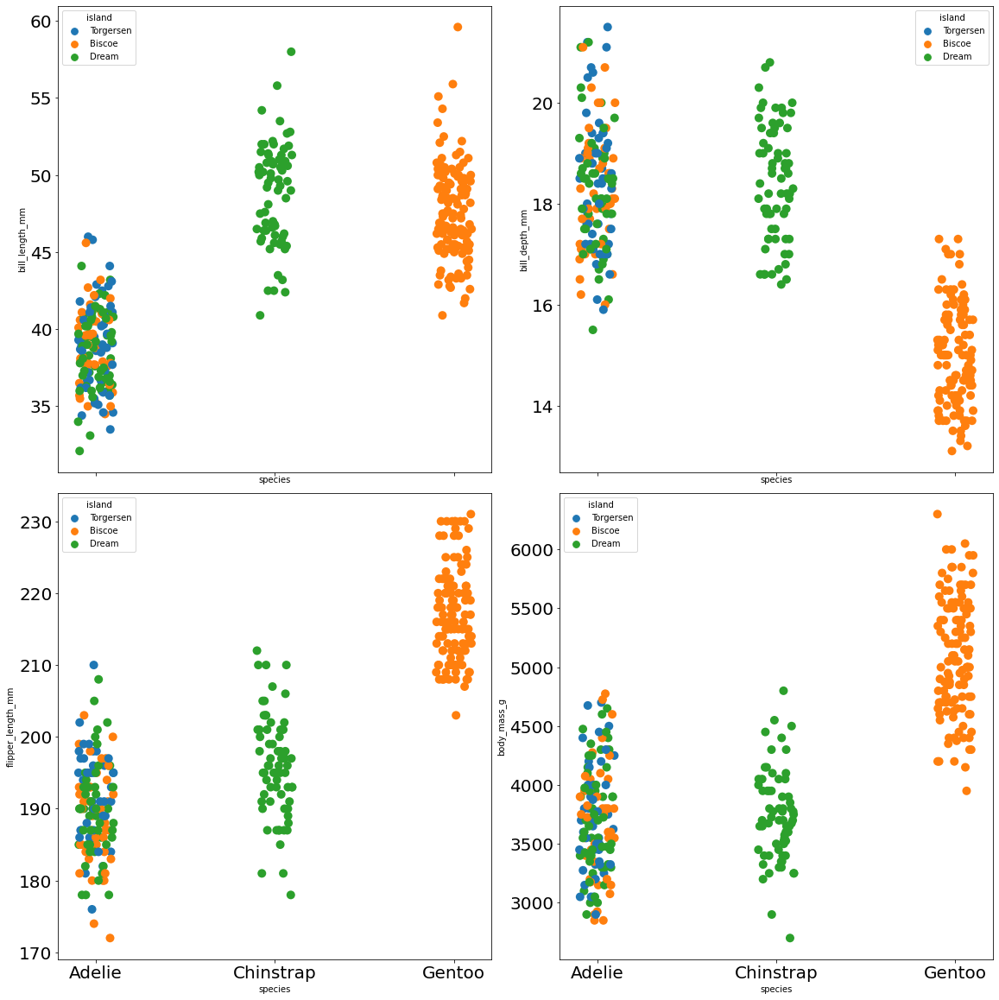

In [183]:
cols = list(filter(lambda col: ds[col].dtype == 'float64', ds.columns))
fig, axes = plt.subplots(ncols=2, nrows=2, sharex='all', figsize=(16, 16))
for i, col, ax in zip(range(len(cols)), cols, axes.flatten()):
    sns.stripplot(data=ds, y=col, x='species', hue='island', ax=ax, size=10)
    ax.autoscale(enable=True)
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontsize(20)
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
plt.show()
fig.clear()

In [184]:
x = ds.drop('species', axis=1).copy()
y = ds.species.copy()

In [185]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.compose import make_column_selector
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score, adjusted_mutual_info_score, adjusted_rand_score



In [186]:
def estimate(x, y, predicted):
    print("Оценка методом silhouette: %.3f" % silhouette_score(x, predicted))
    print("Оценка методом AMI: %.3f" % adjusted_mutual_info_score(y, predicted))
    print("Оценка методом ARI: %.3f" % adjusted_rand_score(y, predicted))

In [187]:
def compare_plot(title, ds, x_predicted):
    cols = list(filter(lambda col: ds[col].dtype == 'float64', ds.columns))
    palette = 'muted'
    size = 120
    n = len(cols)
    fig, axes = plt.subplots(ncols=2, nrows=int(n ** 2), figsize=(16, n**2 * 6),constrained_layout=True)
    ax_real, ax_predict = axes[0]
    ax_real.set_title('Исходные данные')
    ax_predict.set_title('Результат кластеризация')
    fig.suptitle(title, fontsize=16)
    for i, coli in zip(range(n), cols):
        for j, colj in zip(range(n), cols):
            (axi, axj) = axes[i * n + j]
            if i == j:
                sns.histplot(data=ds, x=colj, hue='species', ax=axi, element='poly', palette=palette)
                sns.histplot(data=x_predicted, x=coli, hue='species', element='poly', ax=axj, palette=palette)
            else:
                sns.scatterplot(data=ds, y=coli, x=colj, hue='species', ax=axi, palette=palette, s=size)
                sns.scatterplot(data=x_predicted, y=coli, x=colj, hue='species', ax=axj, palette=palette, s=size)
    # plt.tight_layout()
    plt.show()
    fig.clear()

### Разбиение методом К-средних без предобработки данных

Оценка методом silhouette: 0.621
Оценка методом AMI: 0.201
Оценка методом ARI: 0.106


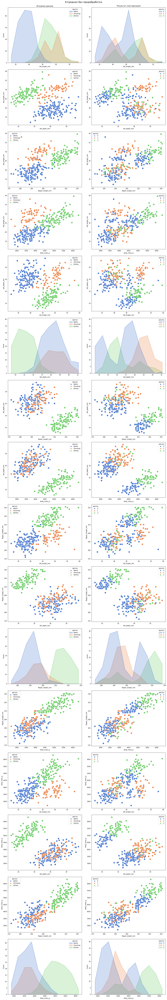

In [188]:
ordinal_transformer = Pipeline([
    ('encoder', OneHotEncoder(dtype=np.uint8))
])

preprocessor = ColumnTransformer(transformers=[
    ('ordinal_transformer', ordinal_transformer, make_column_selector(dtype_include=np.object))
])

pipe = Pipeline([
    ('preprocessor', preprocessor),
    ('estimator', KMeans(n_clusters = 3))
])
pipe.fit(x)

x_predicted = x.copy(deep=True)
predict = pipe.predict(x)
x_predicted['species'] = predict


estimate(preprocessor.fit_transform(x), ds.species, predict)
compare_plot('K-Средних без предобработки',ds, x_predicted)

#### Вывод
Стандартный метод К-средних показал ужасный результат. Попробуем улучшить его

### Разбиение методом К-средних с приминением StandardScaler

Оценка методом silhouette: 0.376
Оценка методом AMI: 0.616
Оценка методом ARI: 0.553


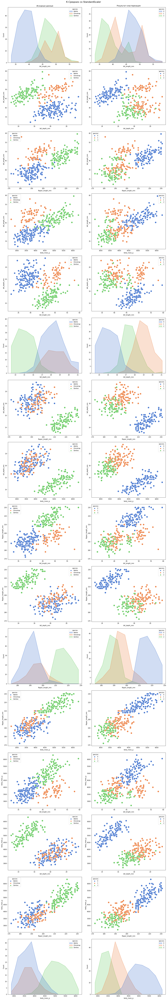

In [189]:
from sklearn.preprocessing import *
float_transformer = Pipeline([
    ('scaler', StandardScaler()),
])

ordinal_transformer = Pipeline([
    ('encoder', OneHotEncoder(dtype=np.uint8))
])

preprocessor = ColumnTransformer(transformers=[
    ('float_transformer', float_transformer, make_column_selector(dtype_include=np.float64)),
    ('ordinal_transformer', ordinal_transformer, make_column_selector(dtype_include=np.object))
])

pipe = Pipeline([
    ('preprocessor', preprocessor),
    ('estimator', KMeans(n_clusters = 3, n_init=100, max_iter=1000))
])
pipe.fit(x)

x_predicted = x.copy(deep=True)
predict = pipe.predict(x)
x_predicted['species'] = predict

estimate(preprocessor.fit_transform(x), ds.species, predict)

compare_plot('К-Средних со StandardScaler', ds, x_predicted)

#### Вывод
Результат получилось улучшить, но он всё ещё не удовлетворительный. Попробуем другие методы

### Разбиение методом AgglomerativeClustering + PolynomialFeatures

Оценка методом silhouette: 0.356
Оценка методом AMI: 0.741
Оценка методом ARI: 0.644


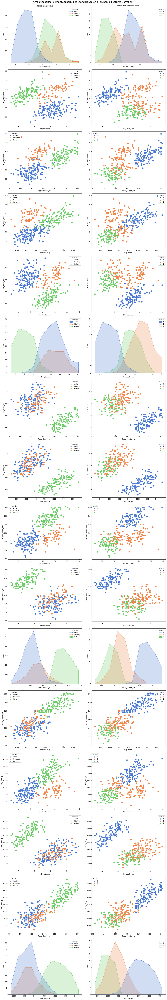

In [190]:
from sklearn.cluster import *

float_transformer = Pipeline([
    ('pf', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
])

ordinal_transformer = Pipeline([
    ('encoder', OneHotEncoder(dtype=np.uint8))
])

preprocessor = ColumnTransformer(transformers=[
    ('float_transformer', float_transformer, make_column_selector(dtype_include=np.float64)),
    ('ordinal_transformer', ordinal_transformer, make_column_selector(dtype_include=np.object))
])

pipe = Pipeline([
    ('preprocessor', preprocessor),
    ('estimator', AgglomerativeClustering(n_clusters=3))
])


pipe.fit(x)

x_predicted = x.copy(deep=True)
predict = pipe.fit_predict(x)
x_predicted['species'] = predict

estimate(preprocessor.fit_transform(x), ds.species, predict)

compare_plot('Аггломеративаня кластеризация со StandardScaler и PolynomialFeatures 2 степени', ds, x_predicted)

### Разбиение методом SpectralClustering + PolynomialFeatures

Оценка методом silhouette: 0.402
Оценка методом AMI: 0.820
Оценка методом ARI: 0.808


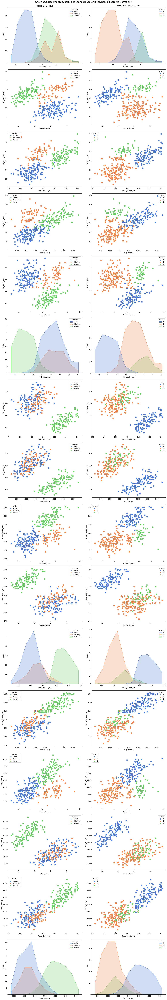

In [191]:
from sklearn.cluster import *

float_transformer = Pipeline([
    ('pf', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
])

ordinal_transformer = Pipeline([
    ('encoder', OneHotEncoder(dtype=np.uint8))
])

preprocessor = ColumnTransformer(transformers=[
    ('float_transformer', float_transformer, make_column_selector(dtype_include=np.float64)),
    ('ordinal_transformer', ordinal_transformer, make_column_selector(dtype_include=np.object))
])

pipe = Pipeline([
    ('preprocessor', preprocessor),
    ('estimator', SpectralClustering(n_clusters=3))
])


pipe.fit(x)

x_predicted = x.copy(deep=True)
predict = pipe.fit_predict(x)
x_predicted['species'] = predict

estimate(preprocessor.fit_transform(x), ds.species, predict)

compare_plot('Спектральная кластеризация со StandardScaler и PolynomialFeatures 2 степени', ds, x_predicted)

### Разбиение методом Birch

Оценка методом silhouette: 0.380
Оценка методом AMI: 0.984
Оценка методом ARI: 0.992


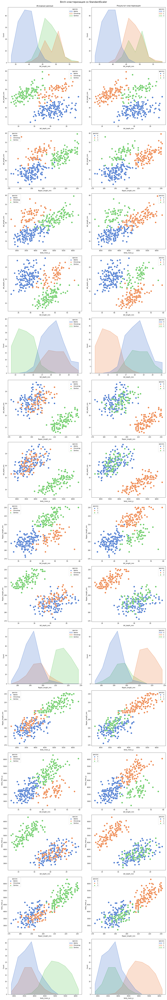

In [193]:
from sklearn.cluster import *

float_transformer = Pipeline([
    ('scaler', StandardScaler()),
])

ordinal_transformer = Pipeline([
    ('encoder', OneHotEncoder(dtype=np.uint8))
])

preprocessor = ColumnTransformer(transformers=[
    ('float_transformer', float_transformer, make_column_selector(dtype_include=np.float64)),
    ('ordinal_transformer', ordinal_transformer, make_column_selector(dtype_include=np.object))
])

pipe = Pipeline([
    ('preprocessor', preprocessor),
    ('estimator', Birch(n_clusters=3, threshold=0.795, branching_factor=100))
])


pipe.fit(x)

x_predicted = x.copy(deep=True)
predict = pipe.fit_predict(x)
x_predicted['species'] = predict

estimate(preprocessor.fit_transform(x), ds.species, predict)

compare_plot('Birch кластеризация со StandardScaler', ds, x_predicted)

## Вывод
Метод Birch показал поразительный результат кластеризации, сумев предсказать разбиение с 99% точностью